# Project 19: Data-driven Geo Schelling model


For the realization and the visualization of the gif the following module is required

In [36]:
#!pip install html2image

The module requires Chrome installed in the machine, for the moment is the only browser supported. For this reasion this notebook can't be executed in Coolab. 

### Import the Datasets 

In [37]:
import io
import zipfile
import requests
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [38]:
pd.set_option('display.max_rows', None) #For analyzing the results

#### People dataset
This file contains information about the
racial composition of each census tract in the US 

In [39]:
url = "https://opportunityinsights.org/wp-content/uploads/2018/10/tract_covariates.csv"
data = requests.get(url).content
df = pd.read_csv(io.StringIO(data.decode('utf-8')))
df.head()

,state,county,tract,cz,czname,hhinc_mean2000,mean_commutetime2000,frac_coll_plus2000,frac_coll_plus2010,foreign_share2010,...,singleparent_share2000,traveltime15_2010,emp2000,mail_return_rate2010,ln_wage_growth_hs_grad,jobs_total_5mi_2015,jobs_highpay_5mi_2015,popdensity2010,ann_avg_job_growth_2004_2013,job_density_2013
0,1,1,20100,11101.0,Montgomery,68638.727,26.171911,0.156479,0.254428,0.009950,...,0.250980,0.273034,0.567308,83.500000,0.038233,10109.0,3396.0,504.75183,-0.006769,92.133049
1,1,1,20200,11101.0,Montgomery,57242.512,24.806705,0.146932,0.267194,0.016337,...,0.392523,0.152040,0.493169,81.300003,0.089306,9948.0,3328.0,1682.17050,-0.004253,971.317870
2,1,1,20300,11101.0,Montgomery,75647.727,25.322525,0.224413,0.164159,0.027096,...,0.244856,0.205534,0.578560,79.500000,-0.177743,10387.0,3230.0,1633.41390,0.014218,340.920070
3,1,1,20400,11101.0,Montgomery,74852.055,22.965347,0.230469,0.252744,0.015083,...,0.190722,0.350673,0.596501,83.500000,-0.072311,12933.0,3635.0,1780.03250,-0.019841,207.386370
4,1,1,20500,11101.0,Montgomery,96174.766,26.222353,0.321154,0.375063,0.046488,...,0.168000,0.250496,0.661268,77.300003,-0.096140,12933.0,3635.0,2446.26220,0.018627,800.272640


Manupulate the state, county and tract column so it is compatible with the Census Boureau file. The problem is the different rappresentation of the information (61 in this file and 061 in the census one). I added zeros where necessary to make the geoids of the two dataframes homogeneous.   

In [40]:
df['state'] = df['state'].astype(str)
df['county'] = df['county'].astype(str)
df['tract'] = df['tract'].astype(str)

for index, row in df.iterrows():
  if len(row['state']) == 1:  #state
    value = '0'+ row['state']
    df.at[index, 'state'] =  value 
  
  if len(row['county']) == 1: #county
    value = '00'+ row['county']
    df.at[index, 'county'] =  value 
  if len(row['county']) == 2:
    value = '0'+ row['county']
    df.at[index, 'county'] =  value
  
  if len(row['tract']) < 6: #tract
    value = row['tract']
    while len(value) < 6:
      value = '0' + value
    df.at[index, 'tract'] =  value  

Create the column geoid concatenating the column state, country and tract

In [41]:
df['geoid'] = df['state'].map(str) + df['county'].map(str) + df['tract'].map(str)

Creating the american_share2010 as 1 - forgein_share2010

In [42]:
df['foreign_share2010'].fillna(0, inplace = True) #fill missing values with 0

df['american_share2010'] = 1 - df['foreign_share2010']

Select only the relevant columns for our scope

In [43]:
df = df.filter(['state', 
                'county', 
                'tract', 
                'cz', 
                'czname', 
                'popdensity2010', 
                'foreign_share2010', 
                'american_share2010', 
                'geoid'], axis=1)

df.head()

,state,county,tract,cz,czname,popdensity2010,foreign_share2010,american_share2010,geoid
0,01,001,020100,11101.0,Montgomery,504.75183,0.009950,0.990050,01001020100
1,01,001,020200,11101.0,Montgomery,1682.17050,0.016337,0.983663,01001020200
2,01,001,020300,11101.0,Montgomery,1633.41390,0.027096,0.972904,01001020300
3,01,001,020400,11101.0,Montgomery,1780.03250,0.015083,0.984917,01001020400
4,01,001,020500,11101.0,Montgomery,2446.26220,0.046488,0.953512,01001020500


#### Geography dataset
From the US Census Bureau website I downloaded the file for the year 2010, of the state of New York, County of New York. The file has been saved on my github repository, so it can be automatically downloaded by the notebook.

In [44]:
url = 'https://github.com/The-Saba/Geospatial-project/raw/main/Data.zip'

print('Downloading shapefile...')
r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))
print('Done', end = '\n\n')

z.extractall() # extract to folder
filenames = [y for y in sorted(z.namelist()) for ending in ['dbf', 'prj', 'shp', 'shx', 'xml'] if y.endswith(ending)] 

print('Downloaded file:')
for filename in filenames: #check the downloaded files
  print(filename)

Done

Downloaded file:
Data/tl_2010_36061_tract10.dbf
Data/tl_2010_36061_tract10.prj
Data/tl_2010_36061_tract10.shp
Data/tl_2010_36061_tract10.shp.xml
Data/tl_2010_36061_tract10.shx


In [45]:
shp = filenames[2] #'Data/tl_2010_36061_tract10.shp'
geo_df = gpd.read_file(shp)
geo_df.head()

,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
0,36,061,027100,36061027100,271,Census Tract 271,G5020,S,192555,0,+40.8519392,-073.9342905,"POLYGON ((-73.93666 40.85045, -73.93634 40.851..."
1,36,061,012900,36061012900,129,Census Tract 129,G5020,S,404996,407508,+40.7650139,-073.9998117,"POLYGON ((-74.00827 40.76485, -74.00585 40.768..."
2,36,061,014401,36061014401,144.01,Census Tract 144.01,G5020,S,74319,0,+40.7752486,-073.9475520,"POLYGON ((-73.94937 40.77688, -73.94919 40.776..."
3,36,061,009900,36061009900,99,Census Tract 99,G5020,S,1007102,1125670,+40.7523775,-074.0083669,"POLYGON ((-73.99843 40.75556, -73.99866 40.755..."
4,36,061,014601,36061014601,146.01,Census Tract 146.01,G5020,S,74328,0,+40.7771918,-073.9521610,"POLYGON ((-73.94987 40.77620, -73.95034 40.775..."


#### Prepare the Dataset
<p style='text-align: justify;'>In order to calculate the exact number of people, and the exact number of native and forgein in each tract I read the documentation of the 'People Dataset' and the column 'popdensity2010' is the number of residents per square mile, calculated by dividing the total tract level population in the Decennial Census from 2000 and 2010 with tract land area given in square miles from the 2010 Census Gazetteer Files.</p>

Filter the population dataset to only consider data from the New York census tracts using the Census Bureau file.

In [46]:
filter = geo_df['GEOID10'].tolist() #geoid of New York census tracts 

df = df[df['geoid'].isin(filter)] #consider only the population of New York City
df.head() 

,state,county,tract,cz,czname,popdensity2010,foreign_share2010,american_share2010,geoid
45615,36,061,000100,19400.0,New York,66.666672,0.000000,1.000000,36061000100
45616,36,061,000201,19400.0,New York,87371.430000,0.454364,0.545636,36061000201
45617,36,061,000202,19400.0,New York,63617.391000,0.224750,0.775250,36061000202
45618,36,061,000500,19400.0,New York,0.000000,0.000000,1.000000,36061000500
45619,36,061,000600,19400.0,New York,115989.800000,0.601802,0.398198,36061000600


Retrive the Census Gazetteer File with the information about the exact population of each tract

In [47]:
url = 'https://www2.census.gov/geo/docs/maps-data/data/gazetteer/Gaz_tracts_national.zip'

r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))

z.extractall() # extract to folder
element = z.namelist()[0]
print('Donwloaded files:', element)

Donwloaded files: Gaz_tracts_national.txt


In [48]:
pop_df = pd.read_table(element)
pop_df.head()

#pop10 is the population count of each tract
#aland_sqmi is the Land Area in square miles, the one used for create popdensity2010

,USPS,GEOID,POP10,HU10,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
0,AL,1001020100,1912,752,9809944,36312,3.788,0.014,32.477111,-86.490303
1,AL,1001020200,2170,822,3340505,5846,1.290,0.002,32.475758,-86.472468
2,AL,1001020300,3373,1326,5349274,9054,2.065,0.003,32.474024,-86.459703
3,AL,1001020400,4386,1823,6382705,16244,2.464,0.006,32.471078,-86.444681
4,AL,1001020500,10766,4308,11397725,48412,4.401,0.019,32.458916,-86.421817


Consider only New York City

In [49]:
pop_df['GEOID'] = pop_df['GEOID'].astype(str) #cast the column to string otherwise the filter dosen't work

pop_df = pop_df[pop_df['GEOID'].isin(filter)] #consider only the number of New York City
pop_df.head() 

,USPS,GEOID,POP10,HU10,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
45583,NY,36061000100,2,1,78638,0,0.030,0.000,40.690055,-74.046142
45584,NY,36061000201,3058,1060,90205,88971,0.035,0.034,40.709899,-73.985584
45585,NY,36061000202,7316,3490,298617,481346,0.115,0.186,40.710616,-73.981178
45586,NY,36061000500,0,112,821563,3296589,0.317,1.273,40.690307,-74.017891
45587,NY,36061000600,11367,4140,253844,178614,0.098,0.069,40.709594,-73.988038


popdensity2010 = pop10/aland_sqmi \
I choose to use directly the column pop10 instead of popdensity2010*aland_sqmi 

In [50]:
#check that df and df_2 have the same lenght
df.shape[0], pop_df.shape[0]

(288, 288)

In [51]:
pop_df = pop_df[['GEOID', 'POP10']] #join only the relevant column

df = df.join(pop_df.set_index('GEOID'), on='geoid')
df.head()

,state,county,tract,cz,czname,popdensity2010,foreign_share2010,american_share2010,geoid,POP10
45615,36,061,000100,19400.0,New York,66.666672,0.000000,1.000000,36061000100,2
45616,36,061,000201,19400.0,New York,87371.430000,0.454364,0.545636,36061000201,3058
45617,36,061,000202,19400.0,New York,63617.391000,0.224750,0.775250,36061000202,7316
45618,36,061,000500,19400.0,New York,0.000000,0.000000,1.000000,36061000500,0
45619,36,061,000600,19400.0,New York,115989.800000,0.601802,0.398198,36061000600,11367


Calculate the exact number of Americans and foreigners for each tract

In [52]:
df['forgein'] = df['POP10'] * df['foreign_share2010']
df['forgein'] = df['forgein'].astype(int) #cast to int since are number of people

df['american'] = df['POP10'] - df['forgein']

Join the popolutaion, american and forgein columns in the geography dataset, to be used in the Geoshelling model

In [53]:
df = df[['geoid', 'POP10', 'american', 'forgein']] 

geo_df = geo_df.join(df.set_index('geoid'), on='GEOID10')
geo_df.head()

,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,POP10,american,forgein
0,36,061,027100,36061027100,271,Census Tract 271,G5020,S,192555,0,+40.8519392,-073.9342905,"POLYGON ((-73.93666 40.85045, -73.93634 40.851...",8196,3480,4716
1,36,061,012900,36061012900,129,Census Tract 129,G5020,S,404996,407508,+40.7650139,-073.9998117,"POLYGON ((-74.00827 40.76485, -74.00585 40.768...",6038,4603,1435
2,36,061,014401,36061014401,144.01,Census Tract 144.01,G5020,S,74319,0,+40.7752486,-073.9475520,"POLYGON ((-73.94937 40.77688, -73.94919 40.776...",4864,4097,767
3,36,061,009900,36061009900,99,Census Tract 99,G5020,S,1007102,1125670,+40.7523775,-074.0083669,"POLYGON ((-73.99843 40.75556, -73.99866 40.755...",1945,1631,314
4,36,061,014601,36061014601,146.01,Census Tract 146.01,G5020,S,74328,0,+40.7771918,-073.9521610,"POLYGON ((-73.94987 40.77620, -73.95034 40.775...",4274,3472,802


'init_num people' is the attribute of the Region Agent in the model and indicates the maximum number of Person Agents in that region.
The name of POP10 has been changed so that the model reading the file can automatically set the value for the attribute.

In [54]:
geo_df.rename(columns = {'POP10':'init_num_people'}, inplace = True)

Save the geodataframe as geojson.

In [55]:
geo_df.to_file('new_york.geojson', driver="GeoJSON")  

### Define the model

The model proposed here is a variation of the one provided as an [example](https://github.com/projectmesa/mesa-geo/tree/main/examples/geo_schelling_points).  
The main changes made are: the fact that the model automatically takes the maximum number of people for each census tract directly from the geojson file and the introduction of two classes to visualize the execution directly in the notebook.

In [56]:
import mesa
import mesa_geo
import random
import uuid
import folium
from typing import Dict
from shapely.geometry import Point
import os
import imageio
from PIL import Image
from pathlib import Path
from html2image import Html2Image
from IPython.display import Image as img

Define the two Agents Class

In [57]:
class PersonAgent(mesa_geo.GeoAgent):
  SIMILARITY_THRESHOLD = 0.5

  def __init__(self, unique_id, model, geometry, crs, is_red, region_id):
    super().__init__(unique_id, model, geometry, crs)
    self.is_red = is_red
    self.region_id = region_id

  @property
  def is_unhappy(self):
    if self.is_red:
      return (self.model.space.get_region_by_id(self.region_id).red_pct < self.SIMILARITY_THRESHOLD)
    else:
      return (1 - self.model.space.get_region_by_id(self.region_id).red_pct) < self.SIMILARITY_THRESHOLD

  def step(self):
    if self.is_unhappy:
      random_region_id = self.model.space.get_random_region_id()
      self.model.space.remove_person_from_region(self)
      self.model.space.add_person_to_region(self, region_id=random_region_id)


class RegionAgent(mesa_geo.GeoAgent):
  init_num_people: int
  red_cnt: int
  blue_cnt: int

  def __init__(self, unique_id, model, geometry, crs):
    super().__init__(unique_id, model, geometry, crs)
    self.red_cnt = 0
    self.blue_cnt = 0

  @property
  def red_pct(self):
    if self.red_cnt == 0:
      return 0
    elif self.blue_cnt == 0:
      return 1
    else:
      return self.red_cnt / (self.red_cnt + self.blue_cnt)

  def random_point(self):
    min_x, min_y, max_x, max_y = self.geometry.bounds
    while not self.geometry.contains(random_point := Point(random.uniform(min_x, max_x), random.uniform(min_y, max_y))):
      continue
    return random_point

  def add_person(self, person):
    if person.is_red:
      self.red_cnt += 1
    else:
      self.blue_cnt += 1

  def remove_person(self, person):
    if person.is_red:
      self.red_cnt -= 1
    else:
      self.blue_cnt -= 1

Define the Space (add a geospatial component to a model)

In [58]:
class Space(mesa_geo.GeoSpace):
  _id_region_map: Dict[str, RegionAgent]
  num_people: int

  def __init__(self):
    super().__init__(warn_crs_conversion=False)
    self._id_region_map = {}
    self.num_people = 0

  def add_regions(self, agents):
    super().add_agents(agents)
    for agent in agents:
      self._id_region_map[agent.unique_id] = agent

  def add_person_to_region(self, person, region_id):
    person.region_id = region_id
    person.geometry = self._id_region_map[region_id].random_point()
    self._id_region_map[region_id].add_person(person)
    super().add_agents(person)
    self.num_people += 1

  def remove_person_from_region(self, person):
    self._id_region_map[person.region_id].remove_person(person)
    person.region_id = None
    super().remove_agent(person)
    self.num_people -= 1

  def get_random_region_id(self) -> str:
    return random.choice(list(self._id_region_map.keys()))

  def get_region_by_id(self, region_id) -> RegionAgent:
    return self._id_region_map.get(region_id)

Define the Model

In [59]:
class GeoSchellingModel(mesa.Model):
  def __init__(self, similarity_threshold=0.5):
    super().__init__()
    self.geodf_for_plot = gpd.read_file('new_york.geojson') #load the geodataframe for the folium map
    
    #set the PersonAgent default similarity threshold to the user's specified parameter
    PersonAgent.SIMILARITY_THRESHOLD = similarity_threshold

    self.schedule = mesa.time.RandomActivation(self)
    self.space = Space()
    self.datacollector = mesa.DataCollector({"unhappy": "unhappy", "happy": "happy"})

    # Set up the grid with patches for every NY census tract
    ac = mesa_geo.AgentCreator(RegionAgent, model=self)
    regions = ac.from_file("new_york.geojson", unique_id="GEOID10", set_attributes = True)
    self.h = regions
    self.space.add_regions(regions)

    for region in regions:
        for _ in range(region.init_num_people):
            person = PersonAgent(                    
                unique_id = uuid.uuid4().int,
                model = self,
                crs = self.space.crs,
                geometry = region.random_point(),
                is_red = region.red_cnt < region.forgein, #set PersonAgent as red if there are not enough foreigners
                region_id = region.unique_id)
            self.space.add_person_to_region(person, region_id = region.unique_id)
            self.schedule.add(person)

    self.datacollector.collect(self)

  def create_gif(self, gif_name):
    hti = Html2Image()
    hti.size = (400, 500) #size of the screenshot
    box = (50, 30, 350, 470) #box used for the crop

    for i in range(0, self.schedule.steps + 1):
        hti.screenshot(html_file = str(i) + '.html', save_as = str(i) + '.png') #convert the html folium output to a png
        os.remove(str(i) + '.html') #remove the html file after conversion
    
        image = Image.open(str(i) + '.png')
        cropped_image = image.crop(box) #crop the image for a better visualization
        cropped_image.save(str(i) + '.png')

    image_path = Path()
    images = list(image_path.glob('*.png')) #recover all the map png
    image_list = []
    for file_name in images:
        image_list.append(imageio.imread(file_name)) 
        os.remove(file_name) #remove the used png
    
    imageio.mimwrite(gif_name + '.gif', image_list, fps=2)
    gif = img(gif_name + '.gif')

    return gif    
        
  def create_map(self, save_map):
    m = folium.Map(location=[40.7834300, -73.9662500], zoom_start=11, tiles='CartoDB positron')
    regions = self.space.agents[:288] #the first 288 agents are RegionAgent
    style_function = lambda c : (lambda feature: dict(color=c)) #needed for the style_function
    
    for reg in regions:
        if reg.blue_cnt > reg.red_cnt:
            c = 'blue'
        elif reg.blue_cnt < reg.red_cnt:
            c = 'red'
        else:
            c = 'black' #blue_cnt = red_cnt 
            
        geo = self.geodf_for_plot[self.geodf_for_plot['GEOID10'] == reg.unique_id]
        sim_geo = gpd.GeoSeries(geo['geometry'])
        geo_j = sim_geo.to_json()
        geo_j = folium.GeoJson(data=geo_j, style_function=style_function(c))
        folium.Popup("""Pop: {}, 
                        Blue agents: {}, 
                        Red agents: {}""".format(reg.init_num_people, reg.blue_cnt, reg.red_cnt)).add_to(geo_j)
        geo_j.add_to(m)
        
        if save_map is True: #the map need to be saved only to create the gif
            map_name = str(self.schedule.steps) + '.html'
            m.save(map_name)
        
    return m

  @property
  def unhappy(self):
    num_unhappy = 0
    for agent in self.space.agents:
        if isinstance(agent, PersonAgent):
          if agent.is_unhappy:
            num_unhappy += 1
    return num_unhappy

  @property
  def happy(self):
    return self.space.num_people - self.unhappy

  def step(self):
      self.schedule.step()
      self.datacollector.collect(self)

      if not self.unhappy:
          self.running = False

### Run the model

Blu = Americans  
Red = Foreigners

In [60]:
model = GeoSchellingModel(similarity_threshold = 0.30)

##### Initial situation

In [61]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1355629, 230244)

In [62]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regions: 279
Percentage of Red Agents in mixed regions: 0.27


In [63]:
red_agents = 0
blue_agents = 0
for reg in regions:
    red_agents += reg.red_cnt 
    blue_agents += reg.blue_cnt

print('The Red PersonAgents are: ', red_agents)
print('The Blue PersonAgents are:', blue_agents)
print('The percentage of Red PersonAgent is:', round(red_agents/(red_agents+blue_agents), 2))

The Red PersonAgents are:  450296
The Blue PersonAgents are: 1135577
The percentage of Red PersonAgent is: 0.28


In [64]:
model.create_map(save_map = False) #visualize the initial situation

In [65]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


##### Start the execution

In [66]:
print('0%', end = '')
model.create_map(save_map = True) #save the map of the initial situation

while model.running and model.schedule.steps < 100:
    model.step()
    model.create_map(save_map = True)
    print('-', end = '')
    
print('100%')

0%-------------------------100%


In [67]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 25 steps


##### Results

In [68]:
model.happy, model.unhappy

(1585873, 0)

In [69]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 27
Exclusive Blue regions: 168
Mixed regions: 93
Percentage of Red Agents in mixed regions: 0.57


In [70]:
model.create_map(save_map = False) #visualize the final situation

In [71]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 103


##### Dinamic visualization of the execution

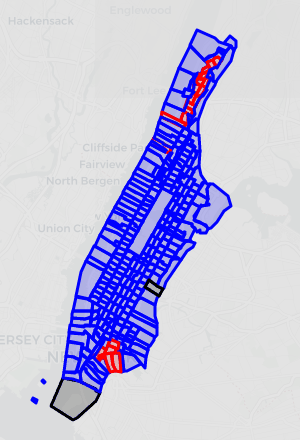

In [72]:
model.create_gif('GifMap_0.30')

In [73]:
model_vars_30 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


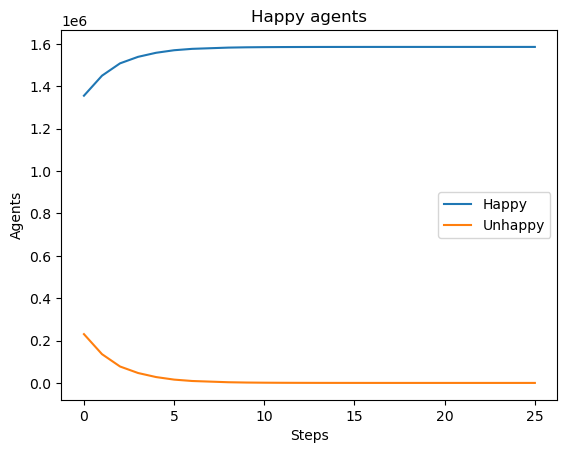

In [74]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_30.happy.plot(label = 'Happy')
model_vars_30.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [75]:
model_vars_30

,unhappy,happy
0,230244,1355629
1,135796,1450077
2,77552,1508321
3,46805,1539068
4,27636,1558237
5,15623,1570250
6,9077,1576796
7,6153,1579720
8,3230,1582643
9,1807,1584066


### Changing the similarity threshold

To speed up execution, the gif will not be created in following models, providing only a static visualization.

##### Similarity 20%

In [40]:
model = GeoSchellingModel(similarity_threshold = 0.20)

In [41]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1501482, 84391)

In [42]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed region: 279
Percentage of Red Agend in mixed region: 0.27


In [43]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [44]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [45]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%----------100%


In [46]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 10 steps


##### Results

In [47]:
model.happy, model.unhappy

(1585873, 0)

In [48]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 10
Exclusive Blue regions: 84
Mixed region: 194
Percentage of Red Agend in mixed region: 0.39


In [49]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 49


In [50]:
model.create_map(save_map = False)

In [51]:
model_vars_20 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


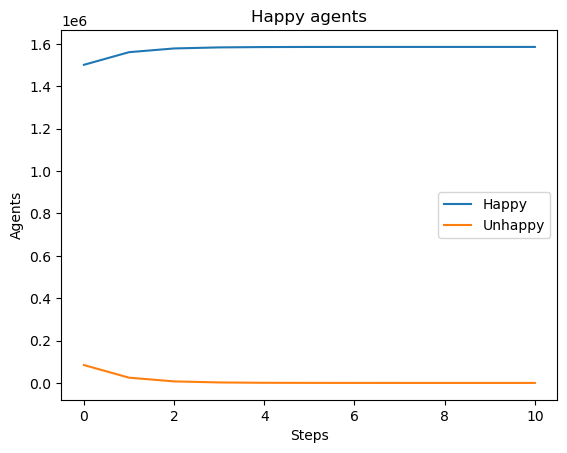

In [52]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_20.happy.plot(label = 'Happy')
model_vars_20.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [53]:
model_vars_20

,unhappy,happy
0,84391,1501482
1,24774,1561099
2,7175,1578698
3,2259,1583614
4,607,1585266
5,174,1585699
6,44,1585829
7,8,1585865
8,3,1585870
9,1,1585872


##### Similarity 40%

In [54]:
model = GeoSchellingModel(similarity_threshold = 0.40)

In [55]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1266860, 319013)

In [56]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed region: 279
Percentage of Red Agend in mixed region: 0.27


In [57]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [58]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [59]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%----------------------------------------------100%


In [60]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 46 steps


##### Results

In [61]:
model.happy, model.unhappy

(1585873, 0)

In [62]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 68
Exclusive Blue regions: 218
Mixed region: 2
Percentage of Red Agend in mixed region: 0.57


In [63]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 70


In [64]:
model.create_map(save_map = False)

In [65]:
model_vars_40 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


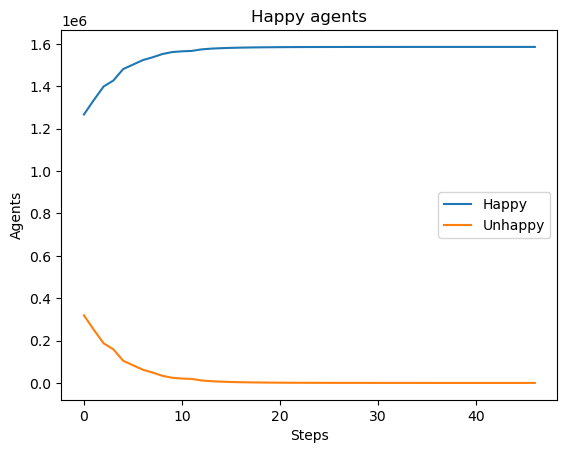

In [66]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_40.happy.plot(label = 'Happy')
model_vars_40.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [67]:
model_vars_40

,unhappy,happy
0,319013,1266860
1,251191,1334682
2,187118,1398755
3,158569,1427304
4,104573,1481300
5,83531,1502342
6,62323,1523550
7,49087,1536786
8,33599,1552274
9,24340,1561533


##### Similarity 50%

In [68]:
model = GeoSchellingModel(similarity_threshold = 0.50)

In [69]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1163615, 422258)

In [70]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed region: 279
Percentage of Red Agend in mixed region: 0.27


In [71]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [72]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [73]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%-------------------------------------------------------------------------------100%


In [74]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 79 steps


##### Results

In [75]:
model.happy, model.unhappy

(1585873, 0)

In [76]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 44
Exclusive Blue regions: 244
Mixed region: 0


In [77]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 44


In [78]:
model.create_map(save_map = False)

In [79]:
model_vars_50 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


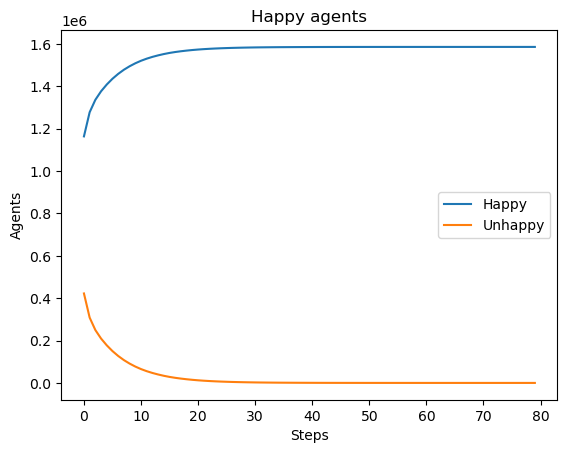

In [80]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_50.happy.plot(label = 'Happy')
model_vars_50.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [81]:
model_vars_50

,unhappy,happy
0,422258,1163615
1,308288,1277585
2,249530,1336343
3,209356,1376517
4,177373,1408500
5,150195,1435678
6,127219,1458654
7,107689,1478184
8,91240,1494633
9,77210,1508663


##### Similarity 60%

In [82]:
model = GeoSchellingModel(similarity_threshold = 0.60)

In [83]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1034962, 550911)

In [84]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regiosn: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed region: 279
Percentage of Red Agend in mixed region: 0.27


In [85]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [86]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [87]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%-------------------------------------------------------------100%


In [88]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 61 steps


##### Results

In [89]:
model.happy, model.unhappy

(1585873, 0)

In [90]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 73
Exclusive Blue regions: 215
Mixed region: 0


In [91]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 73


In [92]:
model.create_map(save_map = False)

In [93]:
model_vars_60 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


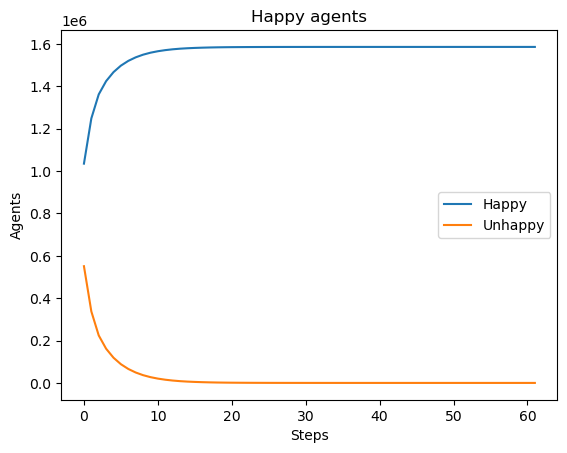

In [94]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_60.happy.plot(label = 'Happy')
model_vars_60.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [95]:
model_vars_60

,unhappy,happy
0,550911,1034962
1,337383,1248490
2,224083,1361790
3,161411,1424462
4,118865,1467008
5,88299,1497574
6,65886,1519987
7,49160,1536713
8,36603,1549270
9,27265,1558608


##### Similarity 75%

In [96]:
model = GeoSchellingModel(similarity_threshold = 0.75)

In [97]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(692348, 893525)

In [98]:
regions = model.space.agents[:288]

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed region: 279
Percentage of Red Agend in mixed region: 0.27


In [99]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [100]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [101]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%-------------------------100%


In [102]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 25 steps


##### Results

In [103]:
model.happy, model.unhappy

(1585873, 0)

In [104]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 146
Exclusive Blue regions: 142
Mixed region: 0


In [105]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 146


In [106]:
model.create_map(save_map = False)

In [107]:
model_vars_75 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


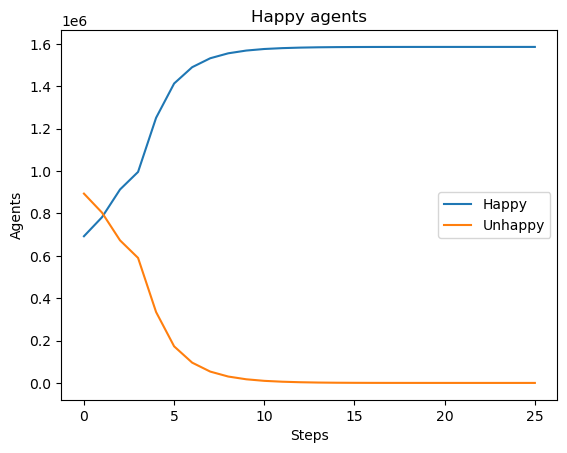

In [108]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_75.happy.plot(label = 'Happy')
model_vars_75.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [109]:
model_vars_75

,unhappy,happy
0,893525,692348
1,803895,781978
2,672921,912952
3,590026,995847
4,334487,1251386
5,172628,1413245
6,95692,1490181
7,53534,1532339
8,30131,1555742
9,17143,1568730


### Analysis of the results

##### Inizializzazione del modello

<p style='text-align: justify;'> Riguardo all'inizializzazione dei modelli, la prima cosa che si osserva è che, non essendo randomica ma partendo da una situazione reale, la distribuzione iniziale delle persone nei tracts è sempre uguale.</p>

<p style='text-align: justify;'>Dei 288 Census Tracts, inizialmente, solamente 21 sono a maggioranza rossa (straniera), 2 hanno lo stesso numero di rossi e blu (americana) e tutti gli altri sono a maggioranza blu. Analizzando nel dettaglio il tipo di persone in ogni Tracts si osserva che solamente 9 di essi sono completamente segregati, 7 esclusivamente blu e 2 esclusivamente rossi, mentre in tutti gli altri Tracts gli agenti sono misti, e in particolare gli agenti rossi in media sono il 27%.</p>

##### Model execution

<p style='text-align: justify;'>Osservando l'esecuzione dei modelli, con l'esclusione di quello con la similarity del 50%, il numero di agenti infelici nei vari steps diminuisce in modo significativo, cioè il maggior numero di agenti si muove in un tract dove è felice, entro il decimo step e si azzera entro il trentesimo step. I modelli con un livello di similarity vicino al 50% per terminare l'esecuzione impegano un numero maggiore di steps. Si nota che il numero in più di steps è causato dalla difficoltà nel allocare un numero relativamente piccolo di agenti infelici, in quanto comunque il maggior numero di agenti diventa felice anche in questo caso entro il decimo step.</p>  
<p style='text-align: justify;'>Infine, concentrandosi sul modello con la similarity del 50% si osserva che gli steps necessari per concludere l'esecuzione sono in media circa 85 e che la diminuzione degli agenti infelici rallenta intorno al ventesimo step.</p>


##### Analisi approfondita del modello con similarity threshold = 0.50
<p style='text-align: justify;'>Il modello con una similarity del 50% impiega molti più steps degli altri modelli, anche rispetto a quelli con una percentuale molto maggiore, a causa della situazione di partenza fortemente sbilanciata. Sul totale dei PersonAgents, infatti, solamente meno del 26% è rosso e, come si osserva dalla distribuzione iniziale delle persone nei vari tracts, la maggioranza di questi sono blu, quindi con al loro interno almeno il 50% di persone blu. Questo comporta che già dall'inizio quasi tutti gli angenti blu siano felici, in quanto si trovano all'interno di tracts già a maggioranza blu, mentre gli agenti rossi sono prevalentemente infelici. Il modello impiega molti steps a convergere proprio a causa di questa disparità, perchè i pochi agenti blu infelici, ovvero quelli che si trovano nei pochi tracts rossi, muovendosi randomicamente in un altro tract avranno un'alta probabilità di finire in uno blu e quindi essere felici. Per gli agenti rossi invece succede l'opposto, avranno un'alta probabilità di muoversi da un tract blu ad un altro blu, restando così infelici e dovendo cambiare nuovamente tract allo step successivo. Quindi il numero elevato di step è dato dalla difficoltà di allocare gli agenti rossi infelici, che possono diventare felici solamente capitando in uno dei pochi tracts rossi oppure muovendosi in massa in un tract blu, riuscendo a superare il numero di agenti blu in esso e convertendolo in rosso, facendo poi spostare gli agenti blu allo step successivo. </p>
    
<p style='text-align: justify;'>Questo problema non si verifica con percentuali maggiori o minori di similarità perchè in caso di percentuali maggiori, più la percentuale sale, più sono i tracts dove inzialmente ogni tipologia di agente è infelice, mentre per le percentuali minori è valido il contrario: miniore è la percentuale, maggiore è il numero di tracts dove ogni tipologia di agente è felice.</p>

##### Risultati finali

<p style='text-align: justify;'>Dopo l'esecuzione del modello, tutti i Person Agents sono felici e si nota come i vari tracts siano molto più segregati rispetto alla situazione di partenza, con una maggioranza di tracts con un solo tipo di agente al loro interno. Questo fenomeno non si osserva in presenza di tolleranza particolarmente alta, ad esempio con una similarità del 20%, dove la quantità di tracts segregati è inferiore alla metà dei tracts totali, con quindi una prevalenza di tracts misti.</p>  
<p style='text-align: justify;'>Già aumentando la similarity al 30% invece il numero di tracts misti è inferiore alla metà. Questi dimiuiscono ulteriormente con un livello di similarity del 40%. Si osserva infine come i tracts misti si azzerino totalmente con la similarity del 50%.</p>

<p style='text-align: justify;'> Si deduce quindi che anche partendo da una situazione iniziale con segregazione quasi pari a zero, già con livelli di similarity del 30% si ottiene una situazione finale dove i tracts segregati sono la maggioranza se non la totalità.</p>

##### Model Initialization

<p style='text-align: justify;'>The first thing we observe about the initialization of the models is that, since it is not random but starts from a real situation, the initial distribution of people in the tracts is always the same.</p>

<p style='text-align: justify;'>Initially, only 21 of the 288 census tracts have a majority of red (foreigners) PersonAgents inside of them, 2 have the same number of reds and blues (American), and all the others have a blue majority. Analyzing in detail the type of people in each tract, it can be observed that only 9 of them are entirely segregated, 7 exclusively blue and 2 exclusively red, while the agents in all the other tracts are mixed, in particular, the red agents are on average the 27%.</p>

##### Model Execution

<p style='text-align: justify;'>Observing the execution of the models, with the exclusion of the one with 50% similarity, the number of unhappy agents in the various steps decreases significantly, move in a tract where they are happy, within the tenth step and it becomes zero within the 30th step. Models with a level of similarity close to 50% require a bigger number of steps to complete the execution. The extra number of steps is caused by the difficulty in allocating a relatively small number of unhappy agents since most of the agents become happy by the tenth step.</p>  
<p style='text-align: justify;'>Finally, focusing on the model with 50% similarity, it can be observed that around 85 steps are necessary to complete the execution and that the decrease in unhappy agents slows down around the twentieth step.</p>

##### In-depth analysis of the model with similarity threshold = 0.50

<p style='text-align: justify;'>The model with a similarity of 50% takes many more steps than the other ones due to the unbalanced starting situation. Only less than 30% of the total PersonAgents are red. As can be seen from the initial situation, the majority of the tracts are blue, so inside them, there are at least 50% of blue agents. This means that almost all the blue agents are happy right from the start, as they are in tracts that already have a blue majority, while the red agents are mostly unhappy. The unhappy blue agents in a red tract, moving randomly into another tract will have a high probability of ending up in a blue one and therefore being happy. On the other hand, the red agents will have a high probability of moving from one blue tract to another blue one, remaining unhappy and having to change the tract again at the next step. So the high number of steps is given by the difficulty of allocating the unhappy red agents, who can become happy only by falling into one of the few red tracts or by moving en masse in a blue tract, managing to overcome the number of blue agents in it and converting it in red.</p>

<p style='text-align: justify;'>This problem does not occur with higher or lower similarity. In the case of higher percentages, the more the percentage rises, the more the tracts where initially each type of agent is unhappy increase. On the contrary, the lower the percentage, the greater the number of tracts where each type of agent is happy.</p>

##### Final results

<p style='text-align: justify;'>After the execution of the model, all the PersonAgents are happy and the tracts are much more segregated than in the starting situation, with a majority of tracts with only one type of agent in them. This phenomenon is not observed in the presence of particularly high tolerance, like with a similarity of 20%, where the quantity of segregated tracts is less than half of the total, with a prevalence of mixed ones.</p>

<p style='text-align: justify;'>If the similarity is increased to 30% the number of mixed tracts is less than half. They decrease even more with a similarity level of 40%. Finally, it can be observed that the mixed tracts become zero with a similarity of 50%.</p>

<p style='text-align: justify;'>In conclusion, it can be deduced that even starting from an initial situation with almost zero segregation, when the similarity levels are 30% or more we obtain a final situation where the segregated tracts are the majority or the totality.</p>